In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly
import plotly.offline as py
plotly.offline.init_notebook_mode()
import plotly.graph_objs as go
%matplotlib inline
from plotly.graph_objs import *

from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_predict
from sklearn import metrics
from sklearn.preprocessing import minmax_scale

from functools import reduce
import scipy.fftpack
import matplotlib.pyplot as plt
import math

In [2]:
def preprocess(dataset):
    dataset.columns = ['time', 'x', 'y', 'z', 'label']
    return dataset

In [3]:
def normalize(dataset):
    bottom = min(dataset['x'].mean(), dataset['y'].mean(),dataset['z'].mean())
    top = max(dataset['x'].mean(), dataset['y'].mean(),dataset['z'].mean())

    dataset['x'] = dataset['x'] / bottom
    dataset['y'] = dataset['y'] / bottom
    dataset['z'] = dataset['z'] / bottom
    return dataset

In [4]:
def rectify(bundle):
    dataset, step = bundle
    length = dataset.shape[0]
    tl = dataset[['time', 'label']][:length-step]
    xyz = dataset[['x', 'y', 'z']][step:].reset_index()[['x', 'y', 'z']]
    return pd.concat([tl, xyz], axis=1)[['time', 'x', 'y', 'z', 'label']]

In [5]:
def extract_raw_info(data):
    # 三轴平均数，三轴最大值，三轴最小值
    # 三轴的标准差，三轴平均绝度差
    # 三轴的均方差
    features = []
    features.append(data['x'].mean())
    features.append(data['y'].mean())
    features.append(data['z'].mean())
    features.append(data['x'].min())
    features.append(data['y'].min())
    features.append(data['z'].min())
    features.append(data['x'].max())
    features.append(data['y'].max())
    features.append(data['z'].max())
    for precent in [.2, .4, .5, .6, .8]:
        qt = data.quantile(precent)
        features.append(qt['x'])
        features.append(qt['y'])
        features.append(qt['z'])

    std = data.std()
    features.append(std['x'])
    features.append(std['y'])
    features.append(std['z'])
    diff = data.diff()
    features.append(diff['x'].abs().mean())
    features.append(diff['y'].abs().mean())
    features.append(diff['z'].abs().mean())
    sem = data.sem()
    features.append(sem['x'])
    features.append(sem['y'])
    features.append(sem['z'])
    skew = data.skew()
    features.append(skew['x'])
    features.append(skew['y'])
    features.append(skew['z'])
    corr = data.corr()
    features.append(corr.ix['x', 'y'])
    features.append(corr.ix['y', 'z'])
    features.append(corr.ix['z', 'x'])
#     cov = data.cov()
#     features.append(cov.ix['x', 'y'])
#     features.append(cov.ix['y', 'z'])
#     features.append(cov.ix['z', 'x'])
#     sqr = data.apply(
#         lambda row: math.sqrt(row['x']**2 + row['y']**2 + row['z']**2), axis=1)
#     features.append(sqr.mean())
    return features

In [6]:
def extract_fft_info(data):
    FEA_START = 1
    FEA_N = 60
    features = []
    for ax in 'xyz':
#         xx = ((data[ax] - data[ax].quantile(.05))/ data[ax].quantile(.95)) * 2 -1
        xx = ((data[ax] - data[ax].quantile(.1))/ (data[ax].quantile(.9)-data[ax].quantile(.1)))

        ff = scipy.fftpack.fft(xx)
        ff = np.abs(ff[FEA_START:FEA_START+FEA_N])
        ff[ff < 20] = 0
        features = features + ff.tolist()
#         features = features + minmax_scale(ff).tolist()
#     return minmax_scale(features).tolist()
    return features

In [7]:
def seq_cut_dataset(dataset):
    results = []
    
    last_label = 1
    last_index = 0
    index = 0
    label_index = 5

    for row in dataset.itertuples():
        if row[label_index] == last_label:
            index = index + 1
            continue
        if last_label == 0:
            index = index + 1
            continue  
        results.append((last_label, dataset.ix[last_index:index-1]))
        last_label = row[label_index]
        last_index = index
        index = index + 1
    return results

In [8]:
CLASS_NUM = 7
SEQ_N = int(20 * 30)

def extract_feature(dataset):
    activity_feature = []

    #0,1,2,3,4,5,6
    #0,1,2,3,1,1,4
    class_map = [0,1,2,3,4,5,6]
    for aid, data in seq_cut_dataset(dataset):
        step = SEQ_N
#         if aid in [2, 3, 5, 6]:
#             step = step // 4
        for start in range(0, len(data), step):
            end = len(data)
            if start + SEQ_N < len(data):
                end = start + SEQ_N
            else:
                start = len(data) - SEQ_N
                if len(data) <= (SEQ_N // 4 * 3):
                    print('skip', end-start, len(data))
                    continue
            seq = data.iloc[start:end]
            class_id = class_map[aid - 1]
            
            features = [class_id]
            features = features + extract_raw_info(seq)
            features = features + extract_fft_info(seq)
#             features = extract_fft_info(aid - 1, seq)
            activity_feature.append(features)
    return pd.DataFrame(activity_feature)

In [9]:
def get_X_y(act_fea_list):
    act_fea = pd.concat(act_fea_list, axis=0)
    act_fea.fillna(0, inplace=True)
    act_fea.columns = ['c' + str(x) for x in range(act_fea.shape[1])]
    X = act_fea.ix[:,'c1':] #!!
    y = act_fea[['c0']]
    return X, y

In [10]:
rectify_steps = [0, 2650, 0, 2100, 0, 2400, 0, 3275, 1700, 0, 0, 0, 1100, 0, 5500]

datasets = [pd.read_csv(str(i) + '.csv', header=None, skipinitialspace=True) for i in range(1, 16)]
datasets = list(map(preprocess, datasets))
datasets = list(map(rectify, zip(datasets, rectify_steps)))
datasets = list(map(normalize, datasets))

trainsets = datasets[:12]
testsets = datasets[12:]

In [11]:
train_act_fea_list = list(map(extract_feature, trainsets))
test_act_fea_list = list(map(extract_feature, testsets))
all_act_fea_list = train_act_fea_list + test_act_fea_list

skip 600 320


In [12]:
train_X, train_y = get_X_y(train_act_fea_list)
test_X, test_y = get_X_y(test_act_fea_list)
all_X, all_y = get_X_y(all_act_fea_list)

In [13]:
from sklearn import tree
from sklearn import linear_model
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import svm
from sklearn.multiclass import OneVsRestClassifier

model = RandomForestClassifier(
    random_state=1,
    n_estimators=40,
    criterion='entropy',
    n_jobs = -1,
    max_depth=12,
)

predicted = cross_val_predict(model, all_X, all_y['c0'].ravel(), cv=10)
print(metrics.accuracy_score(all_y['c0'].ravel(), predicted))

model = RandomForestClassifier(
    random_state=1,
    n_estimators=40,
    criterion = 'entropy',
    n_jobs = -1,
    max_depth=12,
)

model.fit(train_X, train_y['c0'].ravel())
pred = model.predict(test_X)
print(accuracy_score(pred, test_y['c0'].ravel()))

0.716959064327
0.722222222222


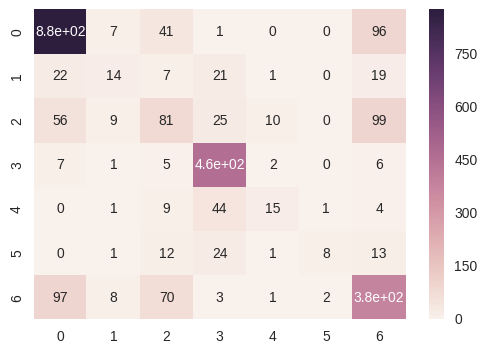

In [14]:
from sklearn.metrics import confusion_matrix

# Compute confusion matrix
cnf_matrix = confusion_matrix(all_y['c0'], predicted)
np.set_printoptions(precision=2)

df_cm = pd.DataFrame(cnf_matrix, index = [str(x) for x in range(0, CLASS_NUM)],
                  columns = [str(x) for x in range(0, CLASS_NUM)])
sns.heatmap(df_cm, annot=True)

In [15]:
# plot_dataset(datasets[0])

In [16]:
train_X.shape

(2133, 219)

## Use the model to scan the whole seq of a dataset and mark every bit

In [17]:
def mark_bit(dataset, model):
    labels = np.zeros(dataset.shape[0])
    activity_feature = []
    activity_position = []
    BIN_N = 5
    step = SEQ_N // BIN_N
    for start in range(0, len(dataset), step):
        end = len(dataset)
        if start + SEQ_N < len(dataset):
            end = start + SEQ_N
        else:
            start = len(dataset) - SEQ_N
        
        seq = dataset.iloc[start:end]
        
        features = extract_raw_info(seq)
        features = features + extract_fft_info(seq)
        
        activity_feature.append(features)
        activity_position.append((start, end))
    
    the_X = pd.DataFrame(activity_feature)
    the_y_proba = model.predict_proba(the_X)
    
    history_class_proba = np.array([np.zeros(CLASS_NUM) for i in range(BIN_N)])
    
    for pos, class_proba in zip(activity_position, the_y_proba):
        history_class_proba = history_class_proba + class_proba
        labels[pos[0]:pos[1]] = np.argmax(history_class_proba[0])
        history_class_proba[0] = 0
        history_class_proba = np.roll(history_class_proba, -1, axis=0)
#         length = pos[1] - pos[0]
#         indent = length // 8
#         labels[pos[0]+indent:pos[1]-indent] = class_id
    return labels

def validate_bit(dataset, labels):
    return np.sum(dataset['label'].as_matrix() == (labels+1) ) / float(dataset.shape[0])

In [18]:
for x in range(0, len(datasets)):
    print(datasets[x].shape)
    print(x, validate_bit(datasets[x], mark_bit(datasets[x], model)))

(162501, 5)
0 0.899385234552
(135351, 5)
1 0.758583239134
(102341, 5)
2 0.91078844256
(120101, 5)
3 0.685339838969
(160001, 5)
4 0.898056887144
(138501, 5)
5 0.722081429015
(163001, 5)
6 0.952570843124
(134726, 5)
7 0.638518177635
(165041, 5)
8 0.820529444199
(126801, 5)
9 0.931096757912
(104451, 5)
10 0.891240868924
(114702, 5)
11 0.897116004952
(66551, 5)
12 0.598788898739
(116101, 5)
13 0.82596187802
(98001, 5)
14 0.649697452067


In [19]:
def plot_dataset(dataset):
    trace0 = go.Scatter(x=dataset['time'], y=dataset['x'])
    trace1 = go.Scatter(x=dataset['time'], y=dataset['y'])
    trace2 = go.Scatter(x=dataset['time'], y=dataset['z'])
    data = Data([trace0, trace1, trace2])
    py.offline.iplot(data)

def plot_label(dataset, label_column):
    dummy_label = pd.get_dummies(label_column)
    label_data = []
    for i in range(1, 8):
        if i not in dummy_label.columns:
            label_data.append(go.Scatter(x=dataset['time'], y=np.zeros(dataset['time'].shape[0])))
        else:
            label_data.append(go.Scatter(x=dataset['time'], y=dummy_label[i]))
    py.offline.iplot(label_data)

def plot_2(dataset):
    plot_label(dataset, dataset['label'])
    plot_label(dataset, pd.DataFrame(mark_bit(dataset, model)+1)[0])

In [20]:
plot_dataset(datasets[12])

In [21]:
plot_2(datasets[12])